##### Steps for reading in dataset (following download), initial QC, dim reduction/clustering and saving out the myeloid cluster for **GSE235676**

file previously downloaded:
GSE235676_RAW.tar

unzipped using 
``` bash
tar -xvf GSE235676_RAW.tar
```

This gives the following files: 
* GSM7507506_Pt1_barcodes.tsv.gz
* GSM7507506_Pt1_features.tsv.gz
* GSM7507506_Pt1_matrix.mtx.gz
* GSM7507507_Pt2_barcodes.tsv.gz
* GSM7507507_Pt2_features.tsv.gz
* GSM7507507_Pt2_matrix.mtx.gz
* GSM7507508_Pt3_barcodes.tsv.gz
* GSM7507508_Pt3_features.tsv.gz
* GSM7507508_Pt3_matrix.mtx.gz
* GSM7507509_Pt4_barcodes.tsv.gz
* GSM7507509_Pt4_features.tsv.gz
* GSM7507509_Pt4_matrix.mtx.gz
* GSM7507510_Pt5_barcodes.tsv.gz
* GSM7507510_Pt5_features.tsv.gz
* GSM7507510_Pt5_matrix.mtx.gz
* GSM7507511_Pt6_barcodes.tsv.gz
* GSM7507511_Pt6_features.tsv.gz
* GSM7507511_Pt6_matrix.mtx.gz
* GSM7507512_Pt7_barcodes.tsv.gz
* GSM7507512_Pt7_features.tsv.gz
* GSM7507512_Pt7_matrix.mtx.gz
* GSM7507513_Pt8_barcodes.tsv.gz
* GSM7507513_Pt8_features.tsv.gz
* GSM7507513_Pt8_matrix.mtx.gz
* GSM7507514_Pt9_barcodes.tsv.gz
* GSM7507514_Pt9_features.tsv.gz
* GSM7507514_Pt9_matrix.mtx.gz
* GSM7507515_Pt10_barcodes.tsv.gz
* GSM7507515_Pt10_features.tsv.gz
* GSM7507515_Pt10_matrix.mtx.gz
* GSM7507516_Pt11_barcodes.tsv.gz
* GSM7507516_Pt11_features.tsv.gz
* GSM7507516_Pt11_matrix.mtx.gz
* GSM7507517_Pt12_barcodes.tsv.gz
* GSM7507517_Pt12_features.tsv.gz
* GSM7507517_Pt12_matrix.mtx.gz
* GSM7507518_Pt13_barcodes.tsv.gz
* GSM7507518_Pt13_features.tsv.gz
* GSM7507518_Pt13_matrix.mtx.gz
* GSM7507519_Pt14_barcodes.tsv.gz
* GSM7507519_Pt14_features.tsv.gz
* GSM7507519_Pt14_matrix.mtx.gz
* GSM7507520_Pt15_barcodes.tsv.gz
* GSM7507520_Pt15_features.tsv.gz
* GSM7507520_Pt15_matrix.mtx.gz
* GSM7507521_Pt16_barcodes.tsv.gz
* GSM7507521_Pt16_features.tsv.gz
* GSM7507521_Pt16_matrix.mtx.gz
* GSM7507522_Pt17_barcodes.tsv.gz
* GSM7507522_Pt17_features.tsv.gz
* GSM7507522_Pt17_matrix.mtx.gz
* GSM7507523_Pt18_barcodes.tsv.gz
* GSM7507523_Pt18_features.tsv.gz
* GSM7507523_Pt18_matrix.mtx.gz
* GSM7507524_Pt19_barcodes.tsv.gz
* GSM7507524_Pt19_genes.tsv.gz
* GSM7507524_Pt19_matrix.mtx.gz
* GSM7507525_Pt20_barcodes.tsv.gz
* GSM7507525_Pt20_genes.tsv.gz
* GSM7507525_Pt20_matrix.mtx.gz
* GSM7507526_Pt21_barcodes.tsv.gz
* GSM7507526_Pt21_genes.tsv.gz
* GSM7507526_Pt21_matrix.mtx.gz
* GSM7507527_Pt22_barcodes.tsv.gz
* GSM7507527_Pt22_genes.tsv.gz
* GSM7507527_Pt22_matrix.mtx.gz
* GSM7507528_Pt23_barcodes.tsv.gz
* GSM7507528_Pt23_genes.tsv.gz
* GSM7507528_Pt23_matrix.mtx.gz
* GSM7507529_Pt24_barcodes.tsv.gz
* GSM7507529_Pt24_genes.tsv.gz
* GSM7507529_Pt24_matrix.mtx.gz


Dataset contains scRNAseq of samples from glioblastoma patients treated with anti-PD1, more details on patients can be found in supp table of PMID: 37460871 however all samples were from the brain (however some patients were newly diagnosed whereas others were recurrent and some recieving neoadjuvant combo therapy).

Will initially keep together but could divide by these properties

Pt1 to Pt18 were done with 10x

Pat 19 to Pt 24 were done using GEXSCOPE --> **exclude** (moved to seperate folder)

Samples I'm using transferred to folders and renamed as necessary


In [1]:
#set wd
getwd()
setwd('/scratch/user/s4436039/scdata/GSE215120')
getwd()

[1] "/scratch/user/s4436039/Nikita-project"

[1] "/scratch/user/s4436039/scdata/GSE215120"

In [2]:
#Load packages
library(dplyr)
library(Seurat)
library(patchwork)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




In [3]:
library(hdf5r)

In [4]:
#load all datasets
AM1.data <- Read10X_h5("GSM6622292_AM1_filtered_feature_bc_matrix.h5")
AM2.data <- Read10X_h5("GSM6622293_AM2_filtered_feature_bc_matrix.h5")
AM3.data <- Read10X_h5("GSM6622294_AM3_pre_filtered_feature_bc_matrix.h5")
AM4.data <- Read10X_h5("GSM6622296_AM4_filtered_feature_bc_matrix.h5")
AM5.data <- Read10X_h5("GSM6622297_AM5_filtered_feature_bc_matrix.h5")
AM6.data <- Read10X_h5("GSM6622298_AM6_filtered_feature_bc_matrix.h5")

CM1.data <- Read10X_h5("GSM6622299_CM1_filtered_feature_bc_matrix.h5")
CM2.data <- Read10X_h5("GSM6622300_CM2_filtered_feature_bc_matrix.h5")
CM3.data <- Read10X_h5("GSM6622301_CM3_filtered_feature_bc_matrix.h5")

CM1_mets.data <- Read10X_h5("GSM6622302_CM1_lym_filtered_feature_bc_matrix.h5")

In [5]:
#Add dataset info to colnames
colnames(AM1.data) <- paste0("GSE215120_AM1_", colnames(AM1.data))
colnames(AM2.data) <- paste0("GSE215120_AM2_", colnames(AM2.data))
colnames(AM3.data) <- paste0("GSE215120_AM3_", colnames(AM3.data))
colnames(AM4.data) <- paste0("GSE215120_AM4_", colnames(AM4.data))
colnames(AM5.data) <- paste0("GSE215120_AM5_", colnames(AM5.data))
colnames(AM6.data) <- paste0("GSE215120_AM6_", colnames(AM6.data))

colnames(CM1.data) <- paste0("GSE215120_CM1_", colnames(CM1.data))
colnames(CM2.data) <- paste0("GSE215120_CM2_", colnames(CM2.data))
colnames(CM3.data) <- paste0("GSE215120_CM3_", colnames(CM3.data))

colnames(CM1_mets.data) <- paste0("GSE215120_CM1_mets_", colnames(CM1_mets.data))

In [6]:
head(colnames(AM1.data))

[1] "GSE215120_AM1_AAACCTGAGCAGCGTA-1" "GSE215120_AM1_AAACCTGAGCCCAATT-1"
[3] "GSE215120_AM1_AAACCTGAGGCGACAT-1" "GSE215120_AM1_AAACCTGAGGGTTCCC-1"
[5] "GSE215120_AM1_AAACCTGCACAGCCCA-1" "GSE215120_AM1_AAACCTGCAGGCAGTA-1"

In [7]:
#create seperate seurat object for each sample
AM1 <- CreateSeuratObject(counts = AM1.data, project = "GSE215120", min.features = 200)
#add metadata to sample
AM1@meta.data$sample_type <- "tumour"
AM1@meta.data$cancer_type <- "Acral Melanoma"
AM1@meta.data$patient_id <- "AM1"
AM1@meta.data$sample_id <- "GSE215120_Acral_MEL_AM1"

In [8]:
#create seperate seurat object for each sample
AM2 <- CreateSeuratObject(counts = AM2.data, project = "GSE215120", min.features = 200)
#add metadata to sample
AM2@meta.data$sample_type <- "tumour"
AM2@meta.data$cancer_type <- "Acral Melanoma"
AM2@meta.data$patient_id <- "AM2"
AM2@meta.data$sample_id <- "GSE215120_Acral_MEL_AM2"

In [9]:
#create seperate seurat object for each sample
AM3 <- CreateSeuratObject(counts = AM3.data, project = "GSE215120", min.features = 200)
#add metadata to sample
AM3@meta.data$sample_type <- "tumour"
AM3@meta.data$cancer_type <- "Acral Melanoma"
AM3@meta.data$patient_id <- "AM3"
AM3@meta.data$sample_id <- "GSE215120_Acral_MEL_AM3"

In [10]:
#create seperate seurat object for each sample
AM4 <- CreateSeuratObject(counts = AM4.data, project = "GSE215120", min.features = 200)
#add metadata to sample
AM4@meta.data$sample_type <- "tumour"
AM4@meta.data$cancer_type <- "Acral Melanoma"
AM4@meta.data$patient_id <- "AM4"
AM4@meta.data$sample_id <- "GSE215120_Acral_MEL_AM4"

In [11]:
#create seperate seurat object for each sample
AM5 <- CreateSeuratObject(counts = AM5.data, project = "GSE215120", min.features = 200)
#add metadata to sample
AM5@meta.data$sample_type <- "tumour"
AM5@meta.data$cancer_type <- "Acral Melanoma"
AM5@meta.data$patient_id <- "AM5"
AM5@meta.data$sample_id <- "GSE215120_Acral_MEL_AM5"

In [12]:
#create seperate seurat object for each sample
AM6 <- CreateSeuratObject(counts = AM6.data, project = "GSE215120", min.features = 200)
#add metadata to sample
AM6@meta.data$sample_type <- "tumour"
AM6@meta.data$cancer_type <- "Acral Melanoma"
AM6@meta.data$patient_id <- "AM6"
AM6@meta.data$sample_id <- "GSE215120_Acral_MEL_AM6"

In [13]:
#create seperate seurat object for each sample
CM1 <- CreateSeuratObject(counts = CM1.data, project = "GSE215120", min.features = 200)
#add metadata to sample
CM1@meta.data$sample_type <- "tumour"
CM1@meta.data$cancer_type <- "Cutaneous Melanoma"
CM1@meta.data$patient_id <- "CM1"
CM1@meta.data$sample_id <- "GSE215120_Cut_MEL_CM1"

In [14]:
#create seperate seurat object for each sample
CM2 <- CreateSeuratObject(counts = CM2.data, project = "GSE215120", min.features = 200)
#add metadata to sample
CM2@meta.data$sample_type <- "tumour"
CM2@meta.data$cancer_type <- "Cutaneous Melanoma"
CM2@meta.data$patient_id <- "CM2"
CM2@meta.data$sample_id <- "GSE215120_Cut_MEL_CM2"

In [15]:
#create seperate seurat object for each sample
CM3 <- CreateSeuratObject(counts = CM3.data, project = "GSE215120", min.features = 200)
#add metadata to sample
CM3@meta.data$sample_type <- "tumour"
CM3@meta.data$cancer_type <- "Cutaneous Melanoma"
CM3@meta.data$patient_id <- "CM3"
CM3@meta.data$sample_id <- "GSE215120_Cut_MEL_CM3"

In [17]:
#create seperate seurat object for each sample
CM1_mets <- CreateSeuratObject(counts = CM1_mets.data, project = "GSE215120", min.features = 200)
#add metadata to sample
CM1_mets@meta.data$sample_type <- "LN metastasis"
CM1_mets@meta.data$cancer_type <- "Cutaneous Melanoma"
CM1_mets@meta.data$patient_id <- "CM1"
CM1_mets@meta.data$sample_id <- "GSE215120_MEL_mets_CM1"

In [18]:
head(AM1@meta.data) 
head(CM2@meta.data)
head(CM1_mets@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE215120_AM1_AAACCTGAGCAGCGTA-1,GSE215120,34962,5254,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_AAACCTGAGCCCAATT-1,GSE215120,2788,1032,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_AAACCTGAGGCGACAT-1,GSE215120,10560,2173,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_AAACCTGAGGGTTCCC-1,GSE215120,1866,824,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_AAACCTGCACAGCCCA-1,GSE215120,2807,1016,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_AAACCTGCAGGCAGTA-1,GSE215120,19363,4012,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE215120_CM2_AAACCCAAGAGGATGA-1,GSE215120,3630,1562,tumour,Cutaneous Melanoma,CM2,GSE215120_Cut_MEL_CM2
GSE215120_CM2_AAACCCAAGGCCCACT-1,GSE215120,27911,6054,tumour,Cutaneous Melanoma,CM2,GSE215120_Cut_MEL_CM2
GSE215120_CM2_AAACCCAAGGGTTAAT-1,GSE215120,12956,3922,tumour,Cutaneous Melanoma,CM2,GSE215120_Cut_MEL_CM2
GSE215120_CM2_AAACCCAAGTATGATG-1,GSE215120,2536,1084,tumour,Cutaneous Melanoma,CM2,GSE215120_Cut_MEL_CM2
GSE215120_CM2_AAACCCAAGTTTCGAC-1,GSE215120,7024,2258,tumour,Cutaneous Melanoma,CM2,GSE215120_Cut_MEL_CM2
GSE215120_CM2_AAACCCACAAACACGG-1,GSE215120,8150,2882,tumour,Cutaneous Melanoma,CM2,GSE215120_Cut_MEL_CM2


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE215120_CM1_mets_AAACCCAAGAAACTAC-1,GSE215120,3443,1019,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1
GSE215120_CM1_mets_AAACCCAAGGCAGCTA-1,GSE215120,3431,1664,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1
GSE215120_CM1_mets_AAACCCAAGTGATCGG-1,GSE215120,681,339,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1
GSE215120_CM1_mets_AAACCCAAGTGCGCTC-1,GSE215120,38943,5723,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1
GSE215120_CM1_mets_AAACCCACACCTGCGA-1,GSE215120,4697,1655,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1
GSE215120_CM1_mets_AAACCCACAGACCAAG-1,GSE215120,2056,1093,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1


In [19]:
#Merge seurat objects

AcMEL <- merge(AM1, y = c(AM2, AM3, AM4, AM5, AM6), project = "GSE215120")
CuMEL <- merge(CM1, y = c(CM2, CM3, CM1_mets), project = "GSE215120")

In [20]:
AcMEL
head(AcMEL@meta.data)
tail(AcMEL@meta.data)

CuMEL
head(CuMEL@meta.data)
tail(CuMEL@meta.data)

An object of class Seurat 
33538 features across 54924 samples within 1 assay 
Active assay: RNA (33538 features, 0 variable features)
 6 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE215120_AM1_AAACCTGAGCAGCGTA-1,GSE215120,34962,5254,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_AAACCTGAGCCCAATT-1,GSE215120,2788,1032,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_AAACCTGAGGCGACAT-1,GSE215120,10560,2173,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_AAACCTGAGGGTTCCC-1,GSE215120,1866,824,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_AAACCTGCACAGCCCA-1,GSE215120,2807,1016,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_AAACCTGCAGGCAGTA-1,GSE215120,19363,4012,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE215120_AM6_TTTGTCAGTTAAGATG-1,GSE215120,3791,1638,tumour,Acral Melanoma,AM6,GSE215120_Acral_MEL_AM6
GSE215120_AM6_TTTGTCAGTTCAGACT-1,GSE215120,1559,860,tumour,Acral Melanoma,AM6,GSE215120_Acral_MEL_AM6
GSE215120_AM6_TTTGTCAGTTTGTTTC-1,GSE215120,4104,1689,tumour,Acral Melanoma,AM6,GSE215120_Acral_MEL_AM6
GSE215120_AM6_TTTGTCATCCATTCTA-1,GSE215120,4516,1811,tumour,Acral Melanoma,AM6,GSE215120_Acral_MEL_AM6
GSE215120_AM6_TTTGTCATCCTTCAAT-1,GSE215120,25636,5359,tumour,Acral Melanoma,AM6,GSE215120_Acral_MEL_AM6
GSE215120_AM6_TTTGTCATCTATCCTA-1,GSE215120,4527,1852,tumour,Acral Melanoma,AM6,GSE215120_Acral_MEL_AM6


An object of class Seurat 
33538 features across 40016 samples within 1 assay 
Active assay: RNA (33538 features, 0 variable features)
 4 layers present: counts.1, counts.2, counts.3, counts.4

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE215120_CM1_AAACCTGAGCAGACTG-1,GSE215120,7488,2346,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1
GSE215120_CM1_AAACCTGAGGATGCGT-1,GSE215120,1916,660,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1
GSE215120_CM1_AAACCTGAGTCTCAAC-1,GSE215120,2396,799,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1
GSE215120_CM1_AAACCTGCAATAACGA-1,GSE215120,4018,1122,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1
GSE215120_CM1_AAACCTGCAGATGGGT-1,GSE215120,5519,1281,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1
GSE215120_CM1_AAACCTGCATACAGCT-1,GSE215120,3149,1249,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE215120_CM1_mets_TTTGTTGCATCGAGCC-1,GSE215120,597,377,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1
GSE215120_CM1_mets_TTTGTTGCATTGCCTC-1,GSE215120,6391,1297,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1
GSE215120_CM1_mets_TTTGTTGGTAATTGGA-1,GSE215120,23491,4425,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1
GSE215120_CM1_mets_TTTGTTGTCGAGAGAC-1,GSE215120,771,429,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1
GSE215120_CM1_mets_TTTGTTGTCGGCTTCT-1,GSE215120,3318,1112,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1
GSE215120_CM1_mets_TTTGTTGTCTCGAACA-1,GSE215120,29857,5216,LN metastasis,Cutaneous Melanoma,CM1,GSE215120_MEL_mets_CM1


Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”
Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


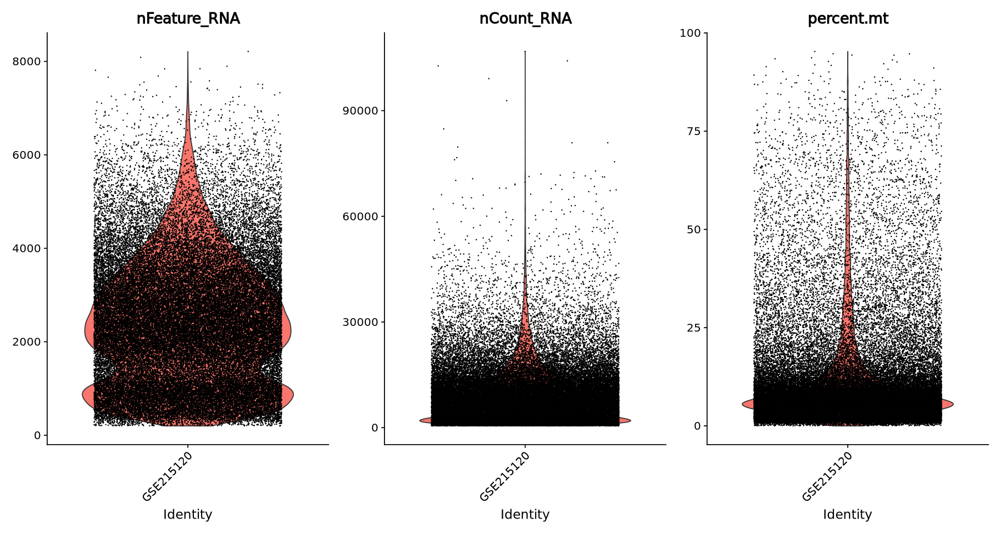

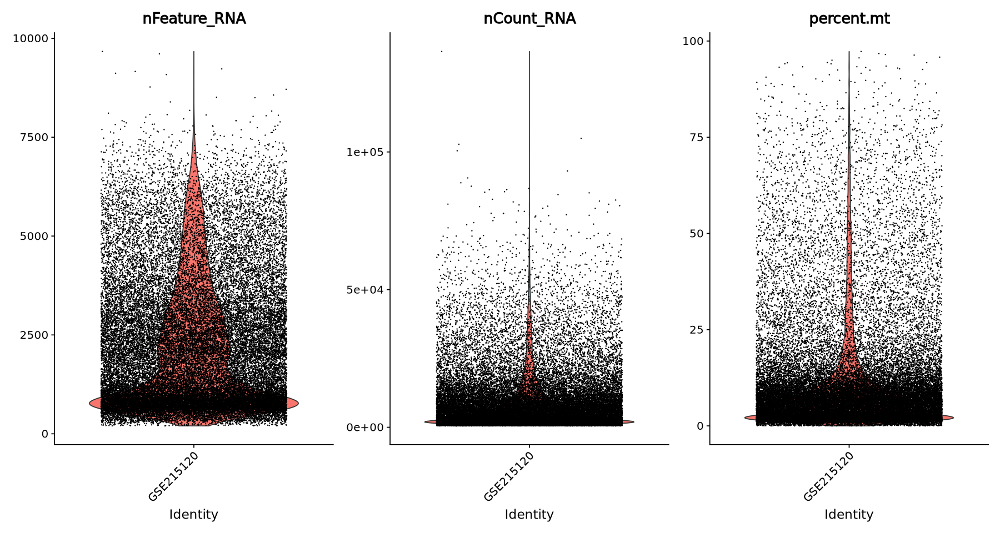

In [21]:
#QC Steps 
AcMEL[["percent.mt"]] <- PercentageFeatureSet(AcMEL, pattern = "^MT-")
#Visualise QC metrics
options(repr.plot.height=8, repr.plot.width=15)
VlnPlot(AcMEL, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

#QC Steps 
CuMEL[["percent.mt"]] <- PercentageFeatureSet(CuMEL, pattern = "^MT-")
#Visualise QC metrics
options(repr.plot.height=8, repr.plot.width=15)
VlnPlot(CuMEL, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

In [22]:
#Normalise the data
AcMEL <- NormalizeData(AcMEL)
#Find variable features
AcMEL <- FindVariableFeatures(AcMEL, selection.method = "vst", nfeatures = 2000)
#Scale the data
AcMEL <- ScaleData(AcMEL, vars.to.regress = c("percent.mt", "nCount_RNA"))
#Run pca
AcMEL <- RunPCA(AcMEL, features = VariableFeatures(object = AcMEL))

Normalizing layer: counts.1

Normalizing layer: counts.2

Normalizing layer: counts.3

Normalizing layer: counts.4

Normalizing layer: counts.5

Normalizing layer: counts.6

Finding variable features for layer counts.1

Finding variable features for layer counts.2

Finding variable features for layer counts.3

Finding variable features for layer counts.4

Finding variable features for layer counts.5

Finding variable features for layer counts.6

Regressing out percent.mt, nCount_RNA

Centering and scaling data matrix

PC_ 1 
Positive:  SPARCL1, COL4A1, GNG11, ESAM, PDLIM1, IGFBP4, COL4A2, IGFBP7, ARHGAP29, TCF4 
	   HTRA1, AQP1, PLVAP, COL15A1, ENG, PECAM1, PLPP3, CLEC14A, SOX18, SPARC 
	   THY1, CD34, TINAGL1, RAMP3, EPAS1, ADGRL4, BGN, MYL9, ADGRF5, CAVIN1 
Negative:  MLANA, S100A1, MITF, PLP1, SERPINE2, PMEL, MIA, BCL2A1, S100B, CRYAB 
	   RGS1, RAB38, HMGA1, NSG1, TYR, SLC24A5, BCAN, DCT, CHCHD6, APOE 
	   GPR143, PIR, SDCBP, TUBB2B, MFSD12, RGS2, MRPL44, CDK4, EMP3, LDHB 
PC_ 2 
P

In [23]:
#Normalise the data
CuMEL <- NormalizeData(CuMEL)
#Find variable features
CuMEL <- FindVariableFeatures(CuMEL, selection.method = "vst", nfeatures = 2000)
#Scale the data
CuMEL <- ScaleData(CuMEL, vars.to.regress = c("percent.mt", "nCount_RNA"))
#Run pca
CuMEL <- RunPCA(CuMEL, features = VariableFeatures(object = CuMEL))

Normalizing layer: counts.1

Normalizing layer: counts.2

Normalizing layer: counts.3

Normalizing layer: counts.4

Finding variable features for layer counts.1

Finding variable features for layer counts.2

Finding variable features for layer counts.3

Finding variable features for layer counts.4

Regressing out percent.mt, nCount_RNA

Centering and scaling data matrix

PC_ 1 
Positive:  SPARC, COL1A2, COL3A1, COL6A2, COL1A1, THY1, BGN, COL6A1, PDGFRB, COL6A3 
	   CALD1, COL4A1, COL4A2, C1R, POSTN, GGT5, PRRX1, CFH, PLPP3, IGFBP4 
	   TCF4, DCN, COL5A1, LUM, IGFBP7, COL5A2, FBN1, FBLN2, COL18A1, EPAS1 
Negative:  CXCR4, CD52, SRGN, CD69, DUSP2, CORO1A, HCST, CCL5, NKG7, IL32 
	   PTPRC, RAC2, CD53, CD3D, CD37, LAPTM5, TRBC2, CD7, TRAC, CYTIP 
	   CD2, CST7, GZMA, CTSW, CCL4, TNFAIP3, CD48, ARHGDIB, DUSP1, LSP1 
PC_ 2 
Positive:  MLANA, PMEL, SERPINE2, SNCA, TYRP1, CD63, QPCT, EDNRB, MITF, LGALS3 
	   AP1S2, SLC24A5, GPM6B, S100A1, S100B, CHCHD6, S100A13, PLP1, RAB38, RHOBTB3 
	   PIR,

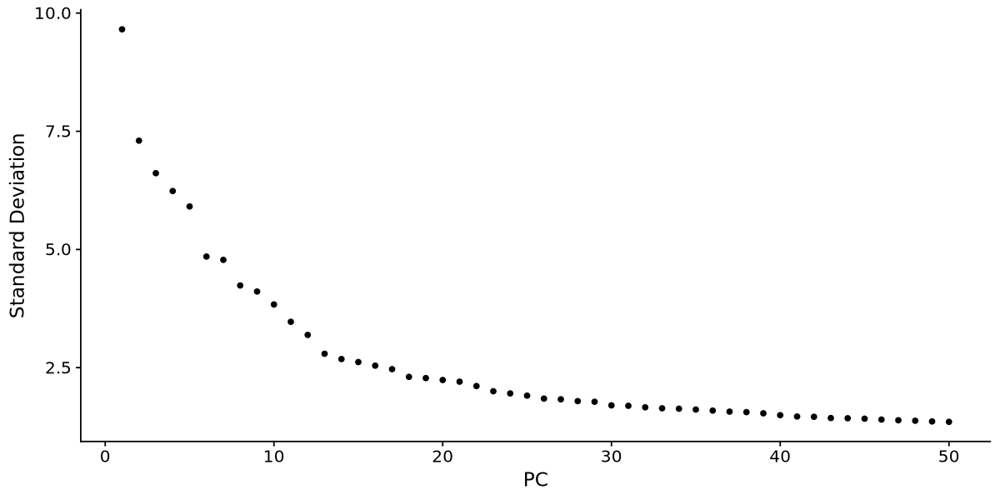

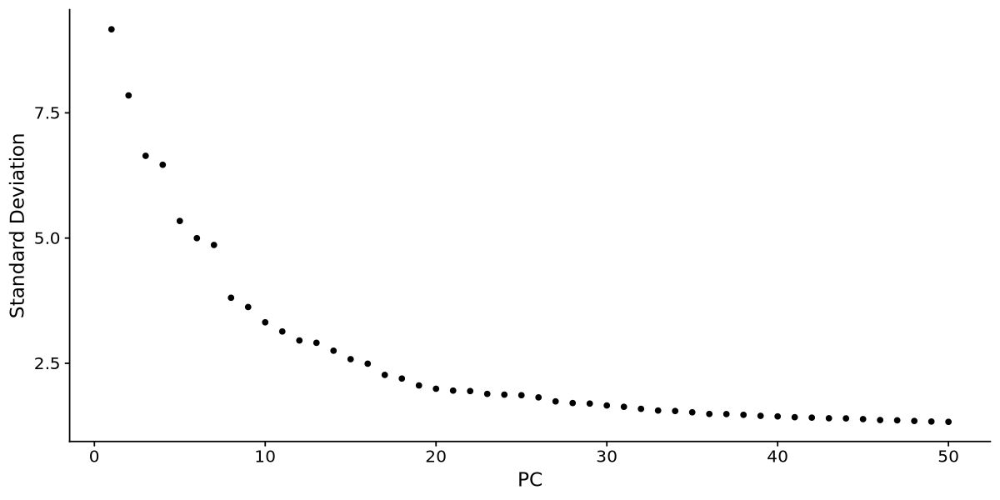

In [24]:
#make elbow plot
options(repr.plot.height=5, repr.plot.width=10)
ElbowPlot(AcMEL, ndims=50)
#in GSE213243 decided to use 40 PC, staying consistent across datasets

#make elbow plot
ElbowPlot(CuMEL, ndims=50)
#in GSE213243 decided to use 40 PC, staying consistent across datasets

In [25]:
#Find neighbours (make sure number matches no. features chosen above)
AcMEL <- FindNeighbors(AcMEL, dims = 1:40)
CuMEL <- FindNeighbors(CuMEL, dims = 1:40)

Computing nearest neighbor graph



Computing SNN

Computing nearest neighbor graph

Computing SNN



In [26]:
#Run UMAP
AcMEL <- RunUMAP(AcMEL, dims = 1:40)
CuMEL <- RunUMAP(CuMEL, dims = 1:40)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


14:31:00 UMAP embedding parameters a = 0.9922 b = 1.112

14:31:00 Read 54924 rows and found 40 numeric columns

14:31:00 Using Annoy for neighbor search, n_neighbors = 30

14:31:00 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:31:04 Writing NN index file to temp file /scratch/temp/9680792/Rtmp0WLSLG/file158cc2d205c34

14:31:04 Searching Annoy index using 1 thread, search_k = 3000

14:31:20 Annoy recall = 100%

14:31:20 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

14:31:22 Initializing from normalized Laplacian + noise (using RSpectra)

14:31:25 Commencing optimization for 200 epochs, with 2430032 positive edges

14:31:44 Optimization finished

14:31:44 UMAP embedding parameters a = 0.9922 b = 1.112

14:31:44 Read 40016 r

In [27]:
#Cluster, resolution here set to 0.2
AcMEL <- FindClusters(AcMEL, resolution = 0.2)
CuMEL <- FindClusters(CuMEL, resolution = 0.2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 54924
Number of edges: 1962444

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9716
Number of communities: 13
Elapsed time: 13 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 40016
Number of edges: 1464043

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9630
Number of communities: 13
Elapsed time: 8 seconds


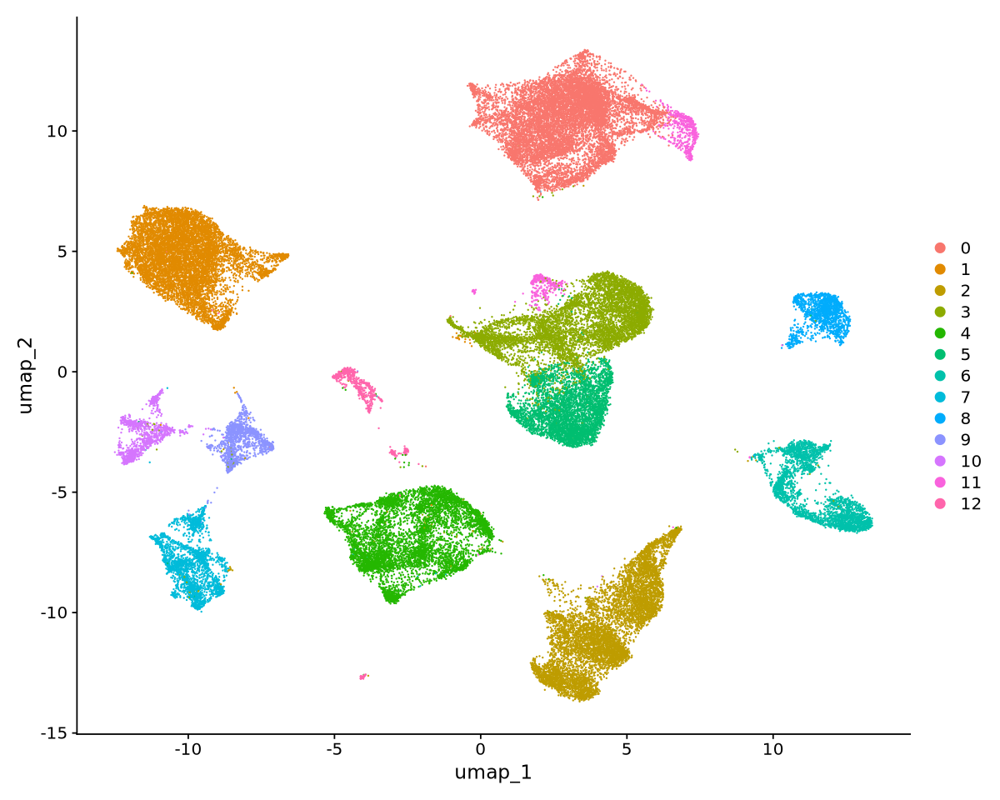

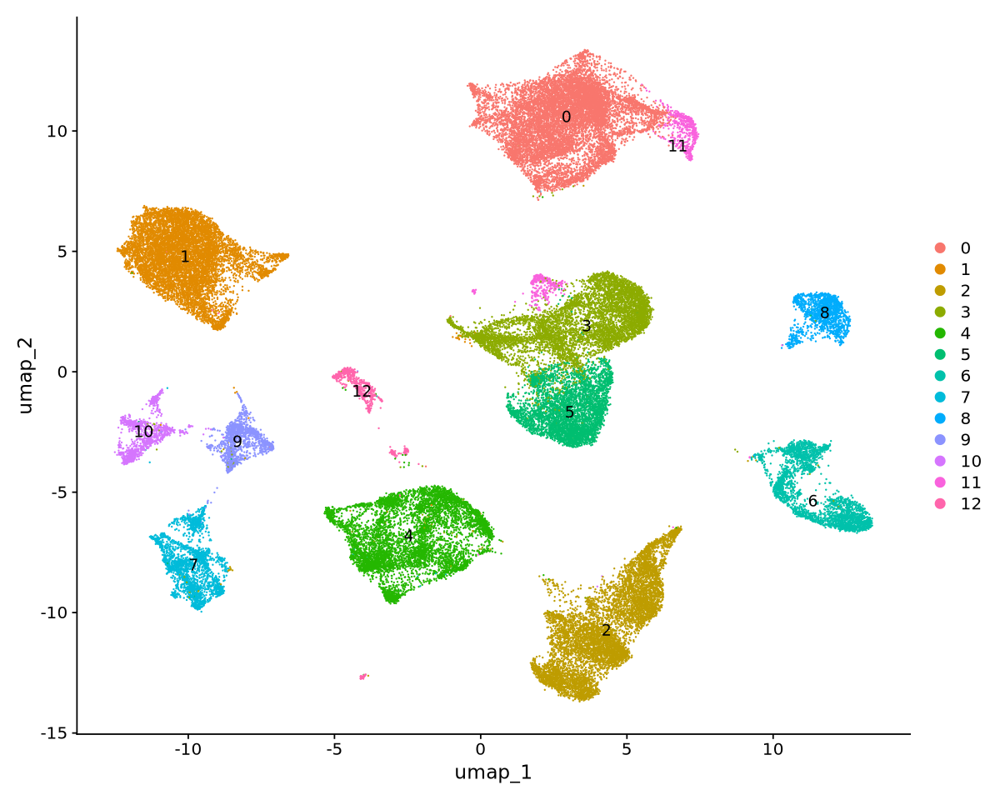

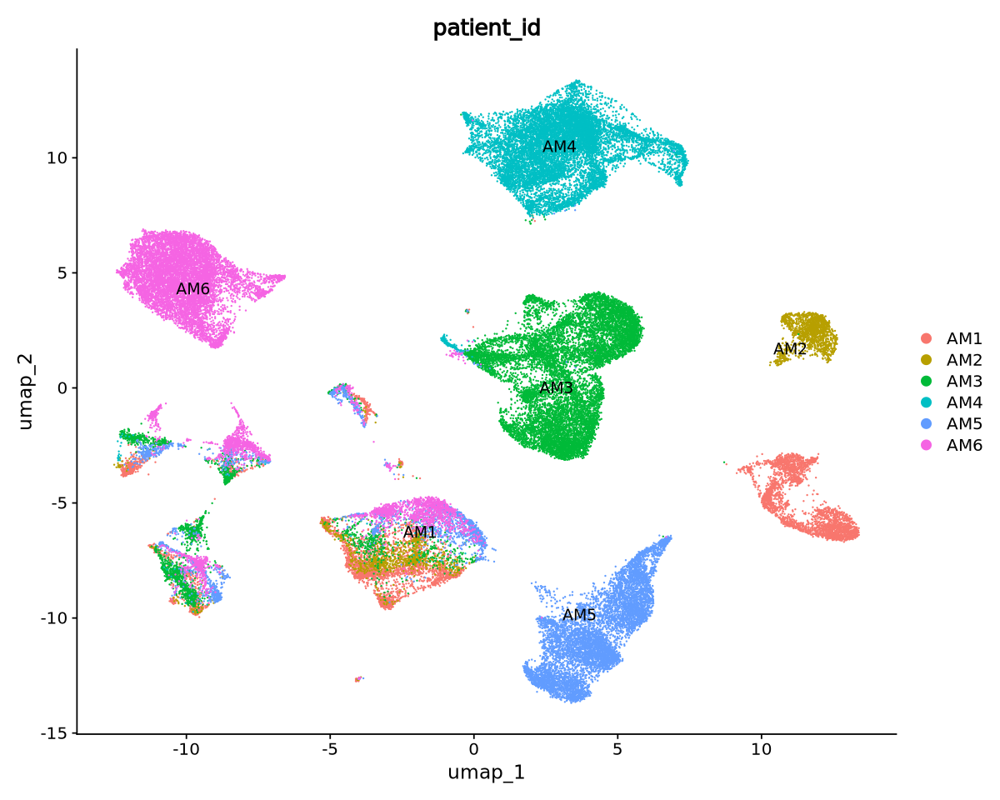

In [28]:
#Plot UMAP
options(repr.plot.height=8, repr.plot.width=10)
DimPlot(AcMEL, reduction = "umap")
DimPlot(AcMEL, reduction = "umap", label=TRUE)
DimPlot(AcMEL, reduction = "umap", label=TRUE, group = "patient_id")

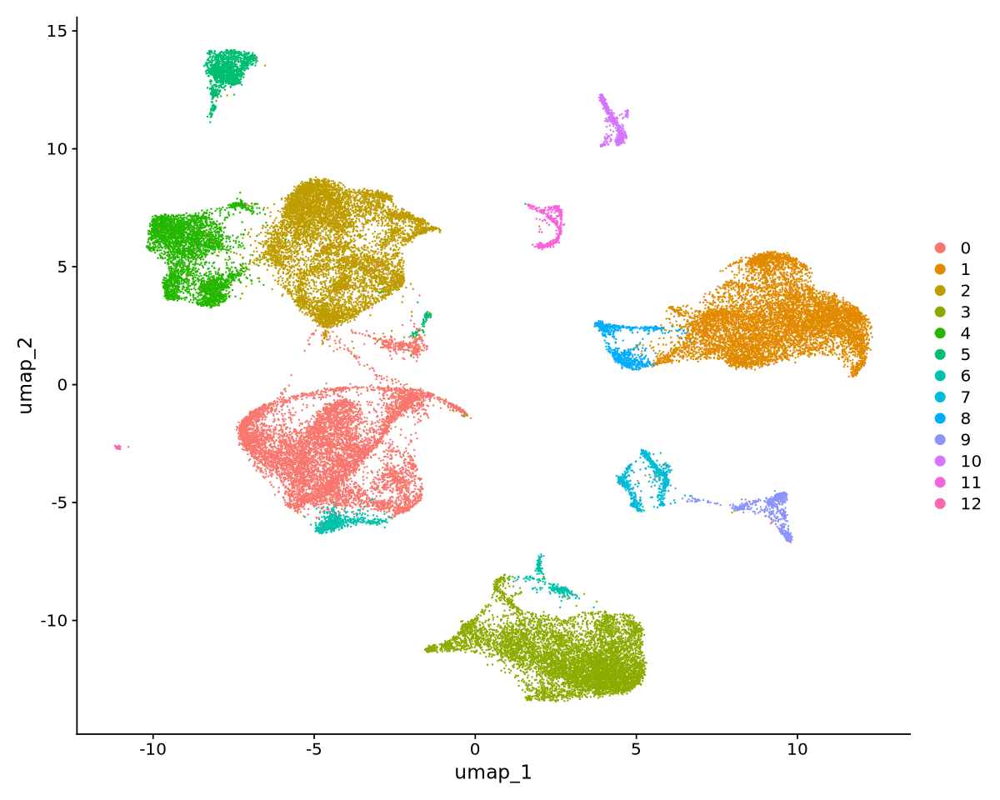

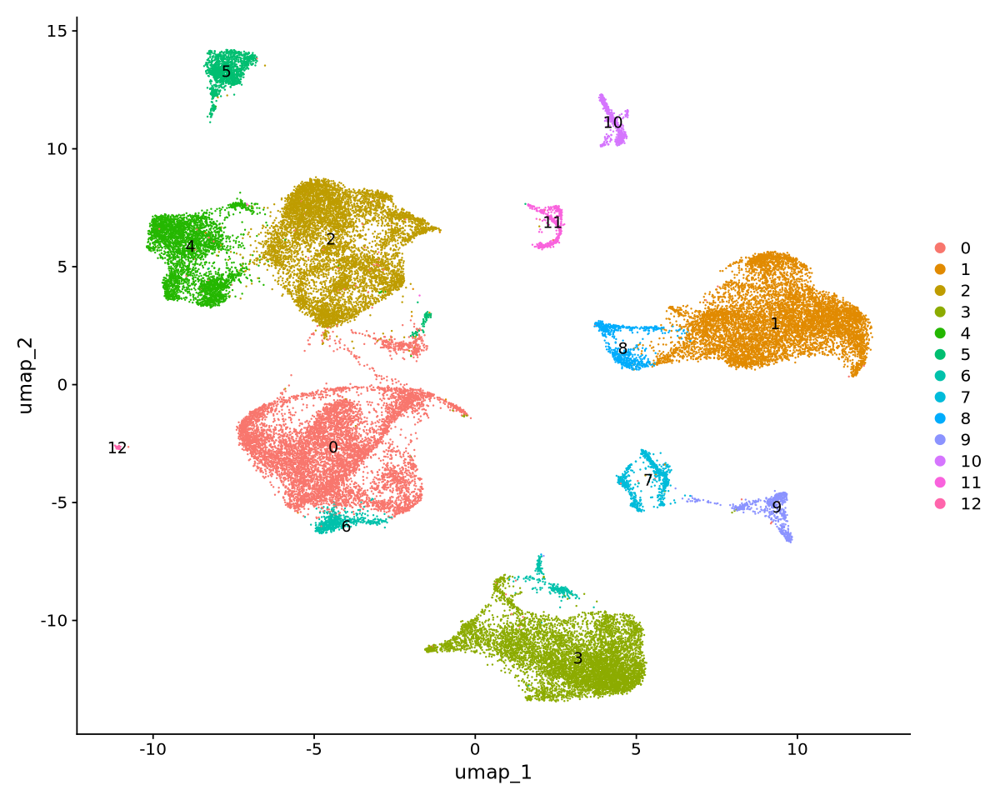

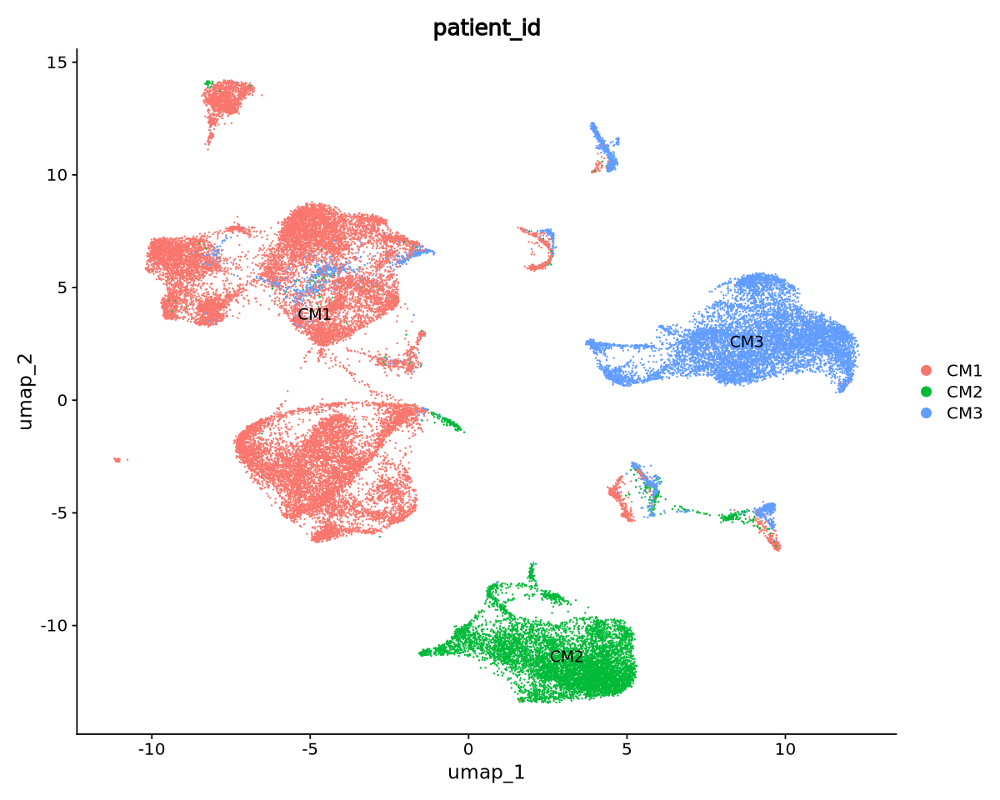

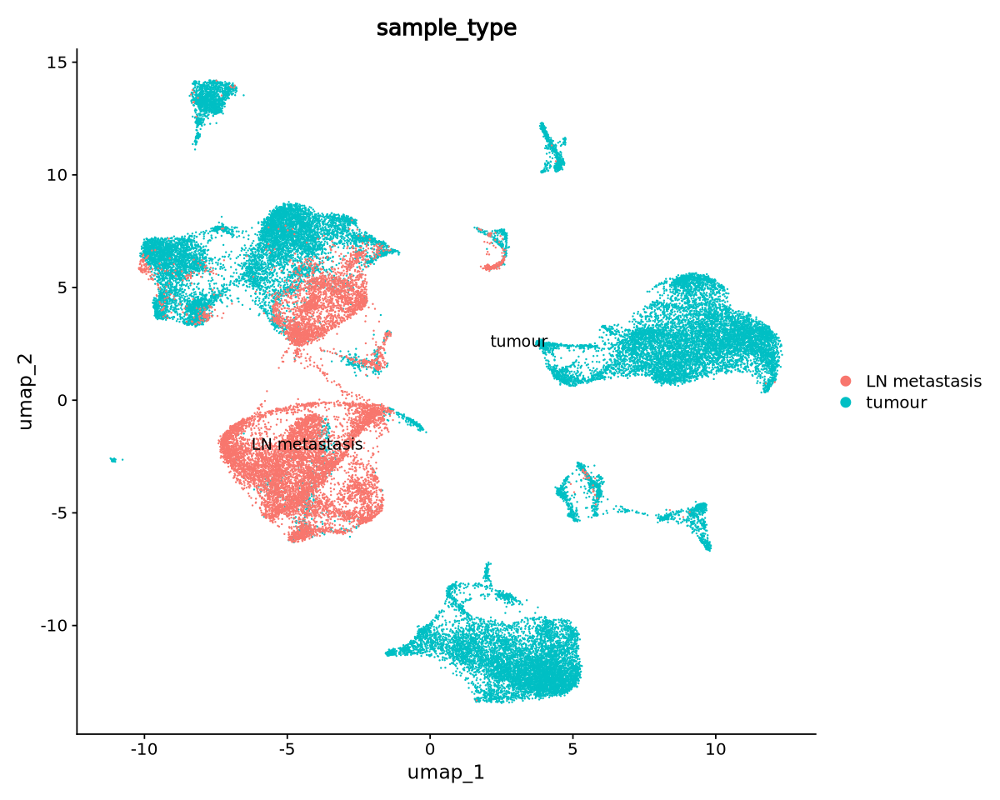

In [29]:
#Plot UMAP
options(repr.plot.height=8, repr.plot.width=10)
DimPlot(CuMEL, reduction = "umap")
DimPlot(CuMEL, reduction = "umap", label=TRUE)
DimPlot(CuMEL, reduction = "umap", label=TRUE, group = "patient_id")
DimPlot(CuMEL, reduction = "umap", label=TRUE, group = "sample_type")

### seperating a lot per patient so keep in mind below

In [30]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(AcMEL, file = "/scratch/user/s4436039/scdata/GSE215120/GSE215120_AcMEL.RDS")
saveRDS(CuMEL, file = "/scratch/user/s4436039/scdata/GSE215120/GSE215120_CuMEL.RDS")

#### Next part of code is about determining which cluster is the myeloid cells

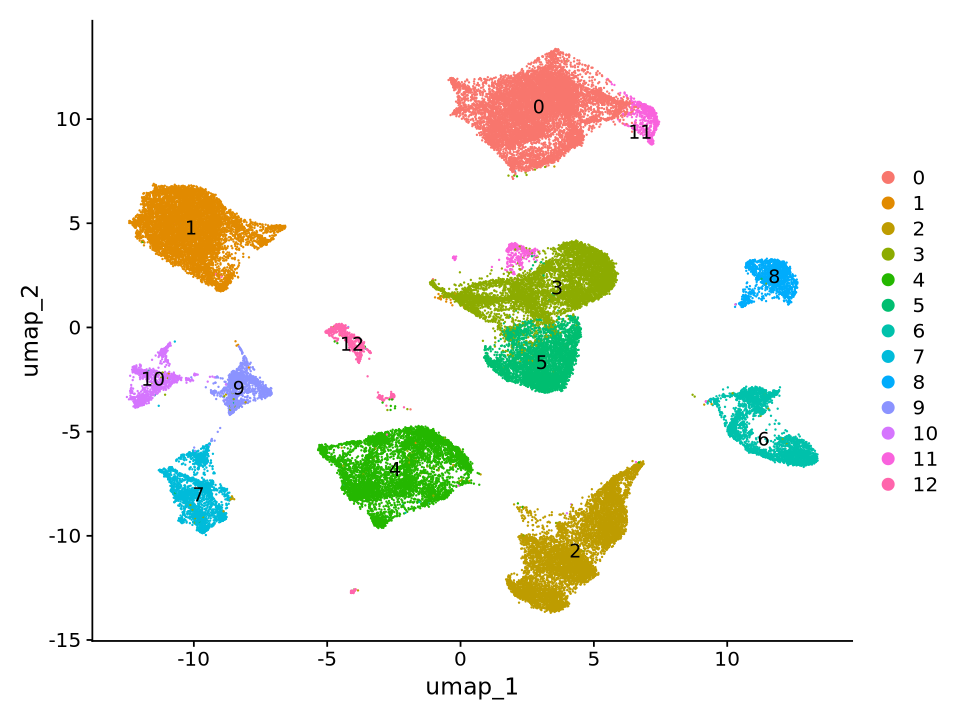

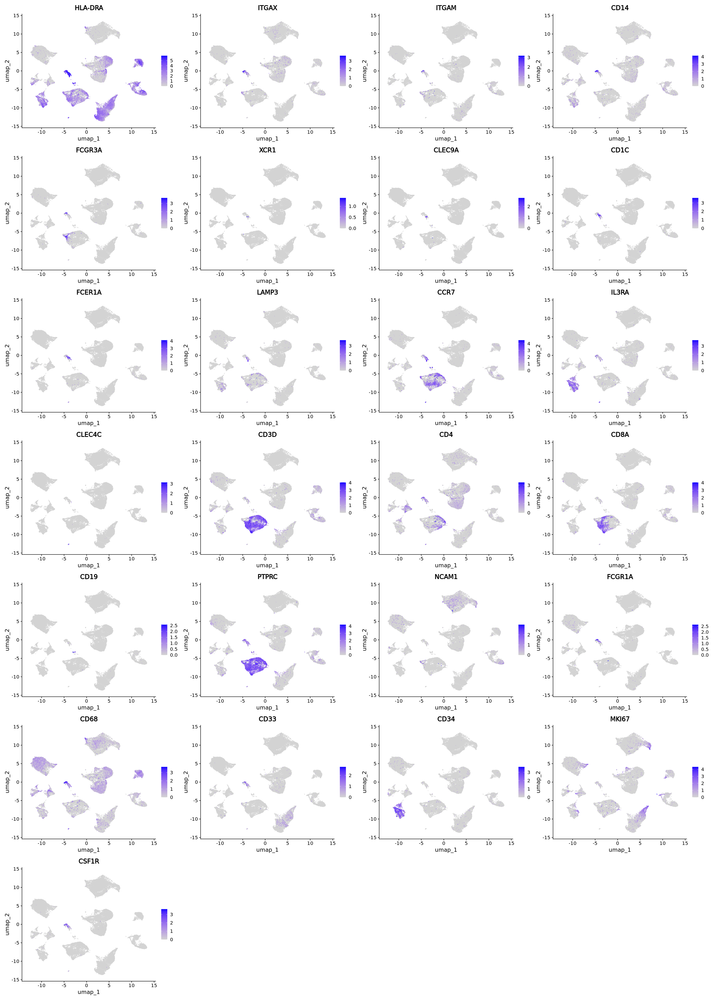

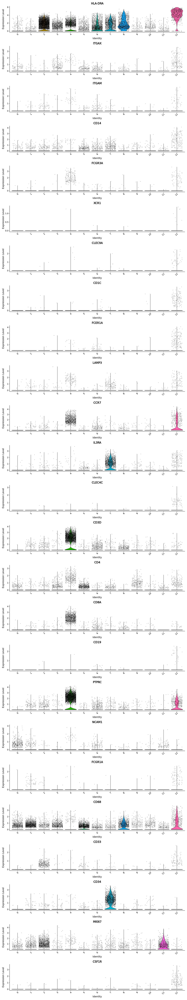

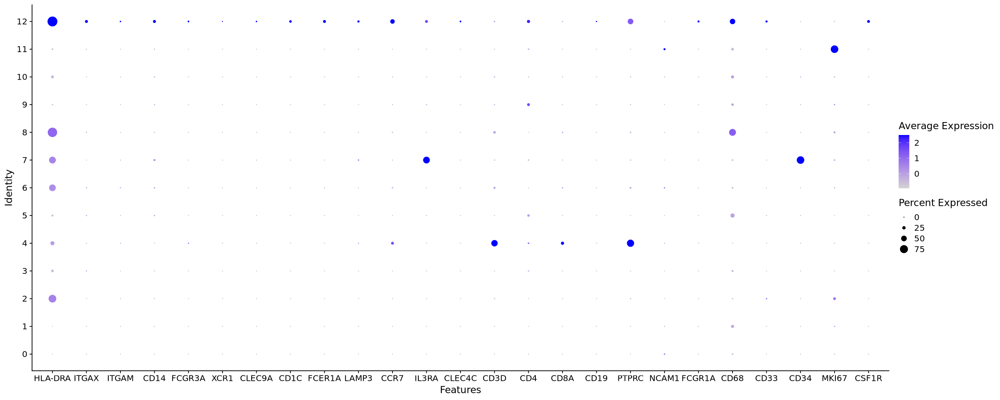

In [31]:
#Same genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(AcMEL, reduction = "umap", label=TRUE)

options(repr.plot.height=35, repr.plot.width=25)
FeaturePlot(AcMEL, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), order = TRUE)

#Violin plots of classic markers
options(repr.plot.height=80, repr.plot.width=15)
VlnPlot(AcMEL, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), ncol=1)

#Same as above but dot plot
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(AcMEL, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"))
     

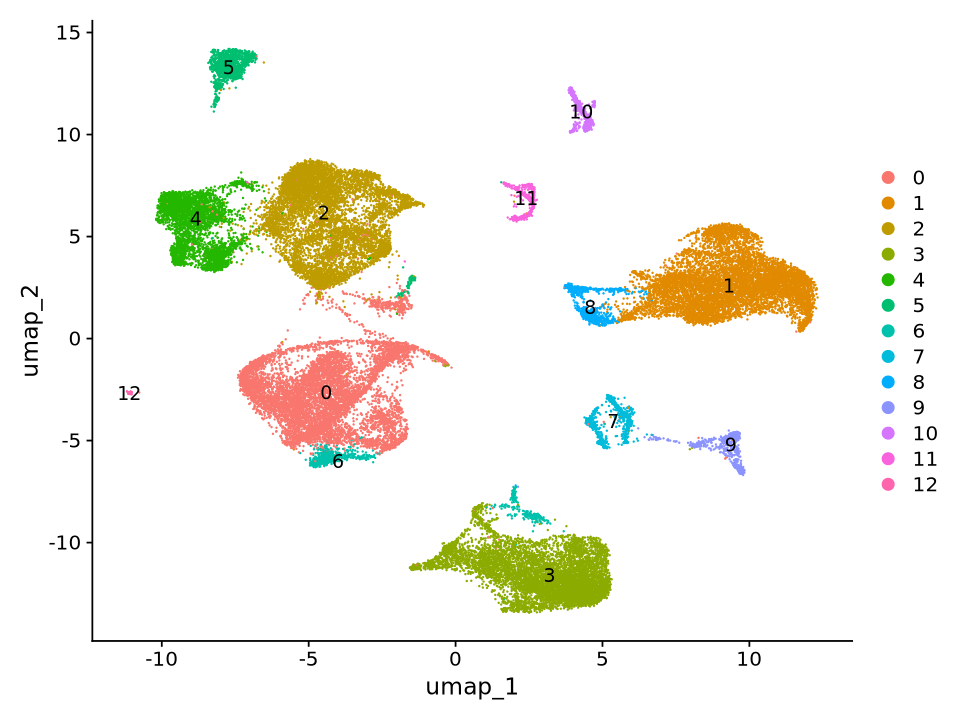

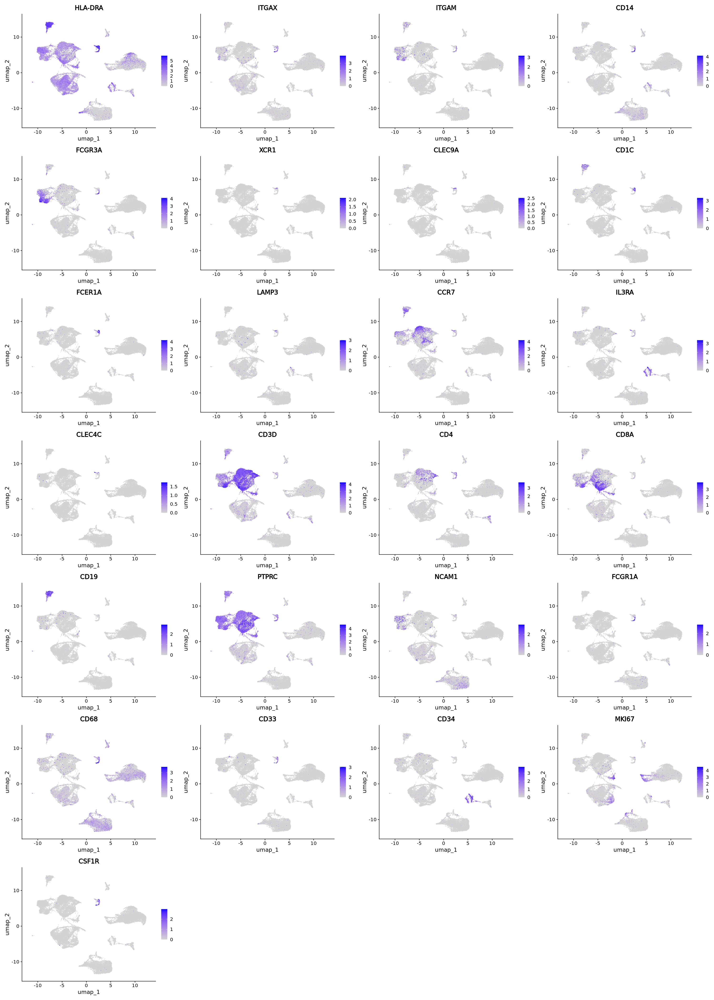

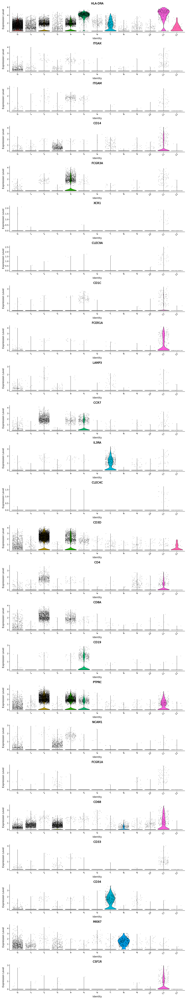

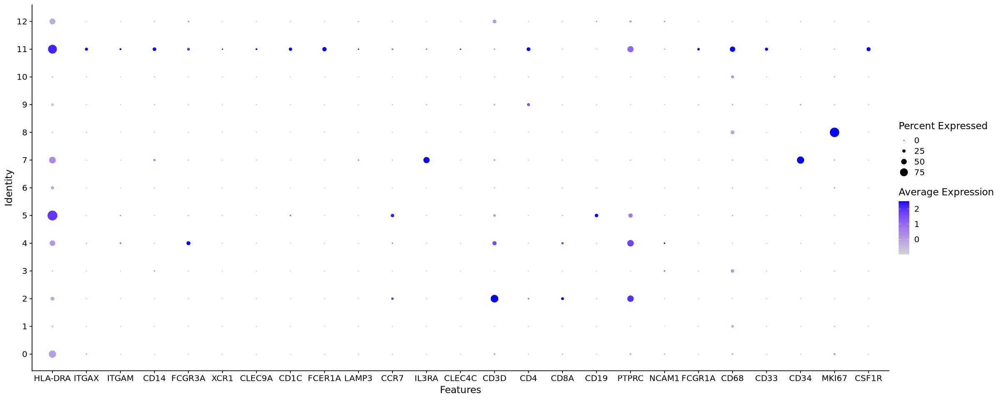

In [32]:
#Same genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(CuMEL, reduction = "umap", label=TRUE)

options(repr.plot.height=35, repr.plot.width=25)
FeaturePlot(CuMEL, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), order = TRUE)

#Violin plots of classic markers
options(repr.plot.height=80, repr.plot.width=15)
VlnPlot(CuMEL, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), ncol=1)

#Same as above but dot plot
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(CuMEL, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"))
     

#### Acral: From above it looks like cluster 12 is the myeloid cells, now subsetting out cluster 12
#### Cutaneous: From above it looks like cluster 11 is the myeloid cells, now subsetting out cluster 11

In [33]:
head(AcMEL@meta.data)
head(CuMEL@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,RNA_snn_res.0.2,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>
GSE215120_AM1_AAACCTGAGCAGCGTA-1,GSE215120,34962,5254,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,12.708083,6,6
GSE215120_AM1_AAACCTGAGCCCAATT-1,GSE215120,2788,1032,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,1.470588,4,4
GSE215120_AM1_AAACCTGAGGCGACAT-1,GSE215120,10560,2173,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,30.501894,6,6
GSE215120_AM1_AAACCTGAGGGTTCCC-1,GSE215120,1866,824,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,1.500536,4,4
GSE215120_AM1_AAACCTGCACAGCCCA-1,GSE215120,2807,1016,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,1.745636,4,4
GSE215120_AM1_AAACCTGCAGGCAGTA-1,GSE215120,19363,4012,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,17.538605,6,6


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,RNA_snn_res.0.2,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>
GSE215120_CM1_AAACCTGAGCAGACTG-1,GSE215120,7488,2346,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1,3.498932,7,7
GSE215120_CM1_AAACCTGAGGATGCGT-1,GSE215120,1916,660,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1,3.183716,2,2
GSE215120_CM1_AAACCTGAGTCTCAAC-1,GSE215120,2396,799,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1,1.711185,2,2
GSE215120_CM1_AAACCTGCAATAACGA-1,GSE215120,4018,1122,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1,4.927825,0,0
GSE215120_CM1_AAACCTGCAGATGGGT-1,GSE215120,5519,1281,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1,1.703207,2,2
GSE215120_CM1_AAACCTGCATACAGCT-1,GSE215120,3149,1249,tumour,Cutaneous Melanoma,CM1,GSE215120_Cut_MEL_CM1,3.366148,4,4


In [34]:
myeloid_AcMEL <- subset(AcMEL, subset = RNA_snn_res.0.2 %in% c("12"))
myeloid_CuMEL <- subset(CuMEL, subset = RNA_snn_res.0.2 %in% c("11"))

In [35]:
myeloid_AcMEL
myeloid_CuMEL

An object of class Seurat 
33538 features across 787 samples within 1 assay 
Active assay: RNA (33538 features, 2000 variable features)
 13 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, data.1, data.2, data.3, data.4, data.5, data.6, scale.data
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
33538 features across 427 samples within 1 assay 
Active assay: RNA (33538 features, 2000 variable features)
 9 layers present: counts.1, counts.2, counts.3, counts.4, data.1, data.2, data.3, data.4, scale.data
 2 dimensional reductions calculated: pca, umap

In [36]:
saveRDS(myeloid_AcMEL, "/scratch/user/s4436039/scdata/GSE215120/GSE215120_AcMEL_myeloid.RDS")
saveRDS(myeloid_CuMEL, "/scratch/user/s4436039/scdata/GSE215120/GSE215120_CuMEL_myeloid.RDS")


#### Following the above then need to move entire GSE215120 folder from scratch to rdm
``` bash
rsync -azvhp /scratch/user/s4436039/scdata/GSE215120/ /QRISdata/Q5935/nikita/scdata/GSE215120
```